In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from umap import UMAP
from imblearn.over_sampling import SMOTE
from sklearn.manifold import TSNE, Isomap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, KernelPCA
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold, SelectKBest, RFE, f_regression, mutual_info_classif

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error, classification_report

from funcs.visualise_func import plot_scatter

# 1. Изучение примеров
Перед выполнением лабораторной работы были изучены представленные примеры

# 2. Загрузка данных

In [2]:
data_regr = pd.read_csv(r'D:\Python\OmGTU\ML\data\post_diamonds.csv')
X_regr = data_regr.drop(columns=['price'])
y_regr = data_regr['price']
X_regr_train, X_regr_test, y_regr_train, y_regr_test = train_test_split(X_regr, y_regr, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_regr_train = scaler.fit_transform(X_regr_train)
X_regr_test = scaler.transform(X_regr_test)

X_regr_train.shape, X_regr_test.shape, y_regr_train.shape, y_regr_test.shape

((43035, 9), (10759, 9), (43035,), (10759,))

In [3]:
model_regr = DecisionTreeRegressor(**{'max_depth': 12, 'min_samples_split': 13, 'min_samples_leaf': 8}, random_state=42)
model_regr.fit(X_regr_train, y_regr_train)

DecisionTreeRegressor(max_depth=12, min_samples_leaf=8, min_samples_split=13,
                      random_state=42)

In [4]:
def regr_res(y_fact, y_pred):
    return [mean_absolute_error(y_fact, y_pred), np.sqrt(mean_squared_error(y_fact, y_pred)),
            r2_score(y_fact, y_pred), mean_absolute_percentage_error(y_fact, y_pred)]

In [5]:
regr_res_pd = pd.DataFrame({'Metrics': ['MAE', 'RMSE', 'R²', 'MAPE']})

In [6]:
regr_res_pd['Full_features(9)'] = regr_res(y_regr_test, model_regr.predict(X_regr_test))
regr_res_pd

,Metrics,Full_features(9)
0,MAE,307.383241
1,RMSE,583.624732
2,R²,0.977653
3,MAPE,0.083662


In [7]:
data_clas = pd.read_csv(r'D:\Python\OmGTU\ML\data\post_card_transdata.csv')
X_clas = data_clas.drop(columns=['fraud'])
y_clas = data_clas['fraud']
X_clas_train, X_clas_test, y_clas_train, y_clas_test = train_test_split(X_clas, y_clas, test_size=0.2, stratify=y_clas, random_state=42)
scaler = StandardScaler()
X_clas_train = scaler.fit_transform(X_clas_train)
X_clas_test = scaler.transform(X_clas_test)
X_clas_train, y_clas_train = SMOTE(random_state=42).fit_resample(X_clas_train, y_clas_train)

X_clas_train.shape, X_clas_test.shape, y_clas_train.shape, y_clas_test.shape

((1460156, 8), (200000, 8), (1460156,), (200000,))

In [8]:
model_clas = DecisionTreeClassifier(min_samples_split=5, max_depth=7, criterion='entropy', class_weight='balanced', random_state=42)
model_clas.fit(X_clas_train, y_clas_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=7, min_samples_split=5, random_state=42)

In [9]:
def clas_res(y_fact, y_pred):
    report = classification_report(y_fact, y_pred, output_dict=True)
    return[round(report['0']['precision'], 2),
           round(report['1']['precision'], 2),
           round(report['0']['recall'], 2),
           round(report['1']['recall'], 2),
           round(report['0']['f1-score'], 2),
           round(report['1']['f1-score'], 2)]

In [10]:
clas_res_pd = pd.DataFrame({'Metrics': ['precision(0)', 'precision(1)', 'recall(0)', 'recall(1)', 'f1(0)', 'f1(1)']})

In [11]:
clas_res_pd['Full_features(8)'] = clas_res(y_clas_test, model_clas.predict(X_clas_test))
clas_res_pd

,Metrics,Full_features(8)
0,precision(0),1.0
1,precision(1),1.0
2,recall(0),1.0
3,recall(1),1.0
4,f1(0),1.0
5,f1(1),1.0


# 3. Решение задачи понижения размерности

## VarianceTreshold

In [12]:
regr_vt = VarianceThreshold(1)
X_regr_train_vt = pd.DataFrame(regr_vt.fit_transform(X_regr_train), columns=list(X_regr.columns[regr_vt.get_support()]))
X_regr_test_vt = pd.DataFrame(regr_vt.transform(X_regr_test), columns=list(X_regr.columns[regr_vt.get_support()]))

X_regr_train_vt.shape, X_regr_test_vt.shape

((43035, 3), (10759, 3))

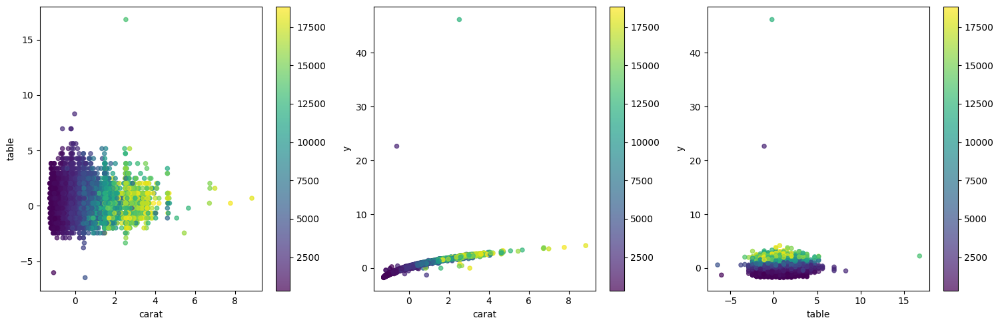

In [13]:
plot_scatter(X_regr_train_vt, y_regr_train)

In [14]:
model_regr.fit(X_regr_train_vt, y_regr_train)

DecisionTreeRegressor(max_depth=12, min_samples_leaf=8, min_samples_split=13,
                      random_state=42)

In [15]:
regr_res_pd['VarianceTreshold(3)'] = regr_res(y_regr_test, model_regr.predict(X_regr_test_vt))
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3)
0,MAE,307.383241,790.608878
1,RMSE,583.624732,1383.822260
2,R²,0.977653,0.874363
3,MAPE,0.083662,0.205722


In [16]:
clas_vt = VarianceThreshold(2.3)
X_clas_train_vt = pd.DataFrame(clas_vt.fit_transform(X_clas_train), columns=list(X_clas.columns[clas_vt.get_support()]))
X_clas_test_vt = pd.DataFrame(clas_vt.transform(X_clas_test), columns=list(X_clas.columns[clas_vt.get_support()]))

X_clas_train_vt.shape, X_clas_test_vt.shape

((1460156, 2), (200000, 2))

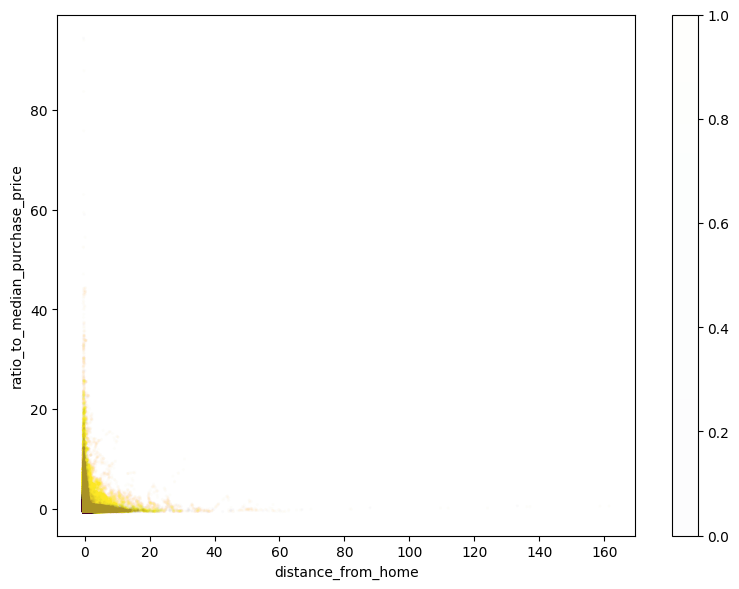

In [17]:
plot_scatter(X_clas_train_vt, y_clas_train, point_size=2, alpha=0.01, palette='viridis')

In [18]:
model_clas.fit(X_clas_train_vt, y_clas_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=7, min_samples_split=5, random_state=42)

In [19]:
clas_res_pd['VarianceTreshold(2)'] = clas_res(y_clas_test, model_clas.predict(X_clas_test_vt))
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2)
0,precision(0),1.0,0.99
1,precision(1),1.0,0.56
2,recall(0),1.0,0.93
3,recall(1),1.0,0.94
4,f1(0),1.0,0.96
5,f1(1),1.0,0.70


## SelectKBest

In [20]:
regr_skb = SelectKBest(score_func=f_regression, k=4)
X_regr_train_skb = pd.DataFrame(regr_skb.fit_transform(X_regr_train, y_regr_train), columns=list(X_regr.columns[regr_skb.get_support()]))
X_regr_test_skb = pd.DataFrame(regr_skb.transform(X_regr_test), columns=list(X_regr.columns[regr_skb.get_support()]))

X_regr_train_skb.shape, X_regr_test_skb.shape

((43035, 4), (10759, 4))

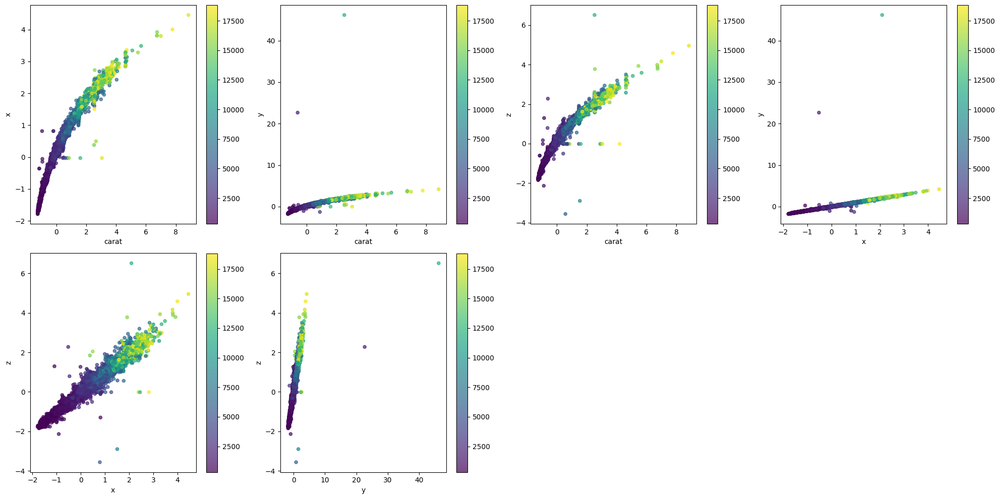

In [21]:
plot_scatter(X_regr_train_skb, y_regr_train)

In [22]:
model_regr.fit(X_regr_train_skb, y_regr_train)

DecisionTreeRegressor(max_depth=12, min_samples_leaf=8, min_samples_split=13,
                      random_state=42)

In [23]:
regr_res_pd['SelectKBest(4)'] = regr_res(y_regr_test, model_regr.predict(X_regr_test_skb))
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4)
0,MAE,307.383241,790.608878,786.582282
1,RMSE,583.624732,1383.822260,1382.802438
2,R²,0.977653,0.874363,0.874548
3,MAPE,0.083662,0.205722,0.199615


In [24]:
clas_skb = SelectKBest(score_func=mutual_info_classif, k=3)
X_clas_train_skb = pd.DataFrame(clas_skb.fit_transform(X_clas_train, y_clas_train), columns=list(X_clas.columns[clas_skb.get_support()]))
X_clas_test_skb = pd.DataFrame(clas_skb.transform(X_clas_test), columns=list(X_clas.columns[clas_skb.get_support()]))

X_clas_train_skb.shape, X_clas_test_skb.shape

((1460156, 3), (200000, 3))

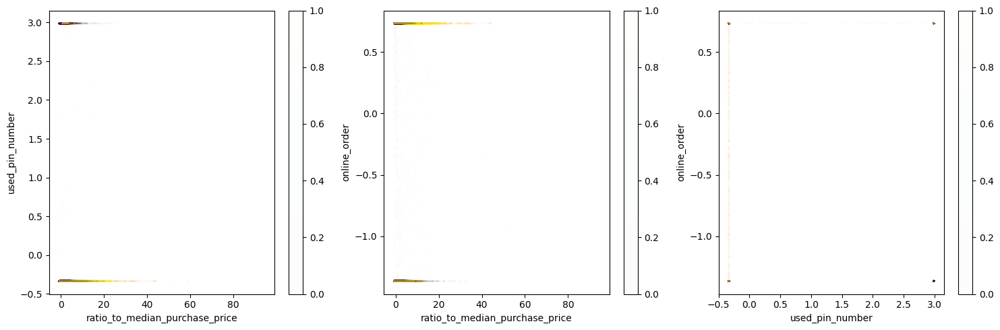

In [25]:
plot_scatter(X_clas_train_skb, y_clas_train, 2, 0.01, palette='viridis')

In [26]:
model_clas.fit(X_clas_train_skb, y_clas_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=7, min_samples_split=5, random_state=42)

In [27]:
clas_res_pd['SelectKBest(3)'] = clas_res(y_clas_test, model_clas.predict(X_clas_test_skb))
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3)
0,precision(0),1.0,0.99,0.98
1,precision(1),1.0,0.56,0.70
2,recall(0),1.0,0.93,0.97
3,recall(1),1.0,0.94,0.74
4,f1(0),1.0,0.96,0.97
5,f1(1),1.0,0.70,0.72


## RFE

In [28]:
regr_rfe = RFE(estimator=model_regr, n_features_to_select=4, verbose=2)
X_regr_train_rfe = pd.DataFrame(regr_rfe.fit_transform(X_regr_train, y_regr_train), columns=list(X_regr.columns[regr_rfe.support_]))
X_regr_test_rfe = pd.DataFrame(regr_rfe.transform(X_regr_test), columns=list(X_regr.columns[regr_rfe.support_]))

X_regr_train_rfe.shape, X_regr_test_rfe.shape

Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.


((43035, 4), (10759, 4))

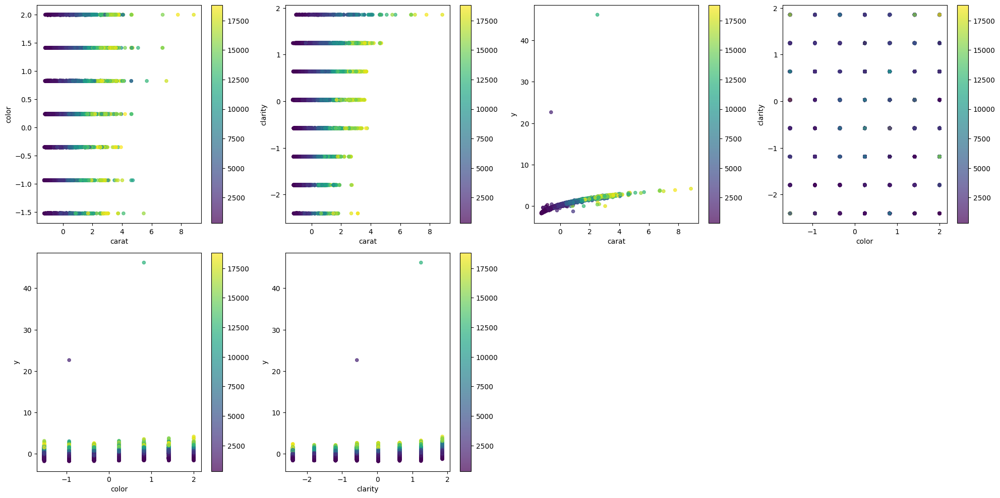

In [29]:
plot_scatter(X_regr_train_rfe, y_regr_train)

In [30]:
model_regr = regr_rfe.estimator_

In [31]:
regr_res_pd['RFE(4)'] = regr_res(y_regr_test, model_regr.predict(X_regr_test_rfe))
regr_res_pd

d:\Python\OmGTU\venv\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(


,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4),RFE(4)
0,MAE,307.383241,790.608878,786.582282,313.026531
1,RMSE,583.624732,1383.822260,1382.802438,586.250557
2,R²,0.977653,0.874363,0.874548,0.977451
3,MAPE,0.083662,0.205722,0.199615,0.088765


In [32]:
clas_rfe = RFE(estimator=model_clas, n_features_to_select=3, verbose=2)
X_clas_train_rfe = pd.DataFrame(clas_rfe.fit_transform(X_clas_train, y_clas_train), columns=list(X_clas.columns[clas_rfe.support_]))
X_clas_test_rfe = pd.DataFrame(clas_rfe.transform(X_clas_test), columns=list(X_clas.columns[clas_rfe.support_]))

X_clas_train_rfe.shape, X_clas_test_rfe.shape

Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.


((1460156, 3), (200000, 3))

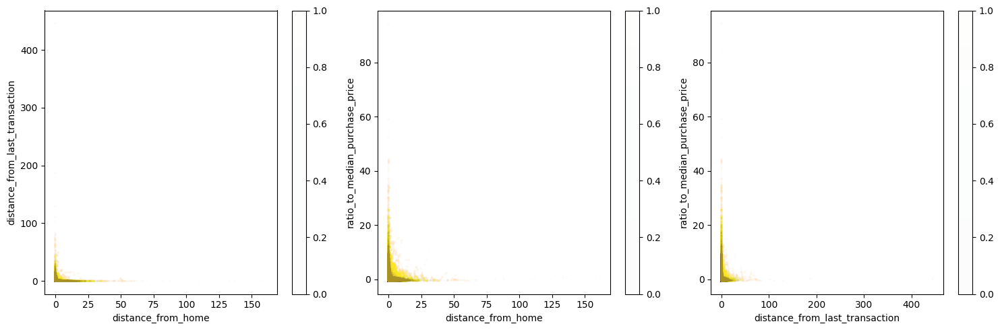

In [33]:
plot_scatter(X_clas_train_rfe, y_clas_train, 2, 0.01, palette='viridis')

In [34]:
model_clas = clas_rfe.estimator_

In [35]:
clas_res_pd['RFE(3)'] = clas_res(y_clas_test, model_clas.predict(X_clas_test_rfe))
clas_res_pd

d:\Python\OmGTU\venv\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3),RFE(3)
0,precision(0),1.0,0.99,0.98,1.00
1,precision(1),1.0,0.56,0.70,0.55
2,recall(0),1.0,0.93,0.97,0.92
3,recall(1),1.0,0.94,0.74,1.00
4,f1(0),1.0,0.96,0.97,0.96
5,f1(1),1.0,0.70,0.72,0.71


## PCA

In [36]:
regr_pca = PCA(0.95, random_state=42)
X_regr_train_pca = pd.DataFrame(regr_pca.fit_transform(X_regr_train, y_regr_train))
X_regr_test_pca = pd.DataFrame(regr_pca.transform(X_regr_test))

X_regr_train_pca.shape, X_regr_test_pca.shape

((43035, 5), (10759, 5))

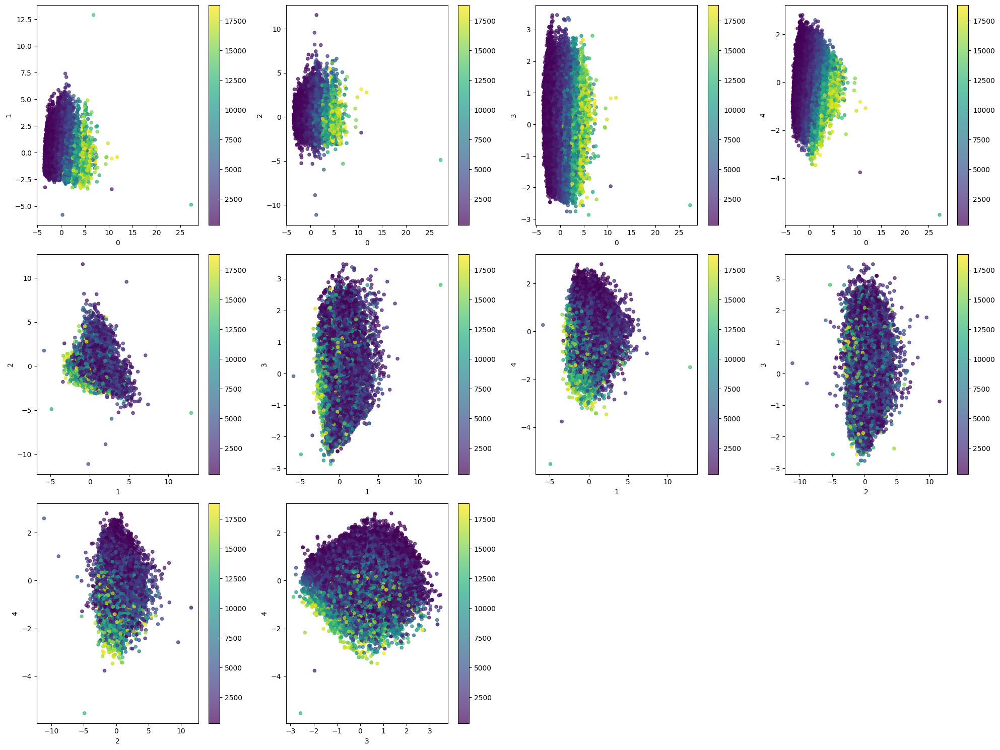

In [37]:
plot_scatter(X_regr_train_pca, y_regr_train)

In [38]:
model_regr = model_regr.fit(X_regr_train_pca, y_regr_train)

In [39]:
regr_res_pd['PCA(5)'] = regr_res(y_regr_test, model_regr.predict(X_regr_test_pca))
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4),RFE(4),PCA(5)
0,MAE,307.383241,790.608878,786.582282,313.026531,413.841598
1,RMSE,583.624732,1383.822260,1382.802438,586.250557,773.825541
2,R²,0.977653,0.874363,0.874548,0.977451,0.960714
3,MAPE,0.083662,0.205722,0.199615,0.088765,0.114470


In [40]:
clas_pca = PCA(0.95, random_state=42)
X_clas_train_pca = pd.DataFrame(clas_pca.fit_transform(X_clas_train, y_clas_train))
X_clas_test_pca = pd.DataFrame(clas_pca.transform(X_clas_test))

X_clas_train_pca.shape, X_clas_test_pca.shape

((1460156, 7), (200000, 7))

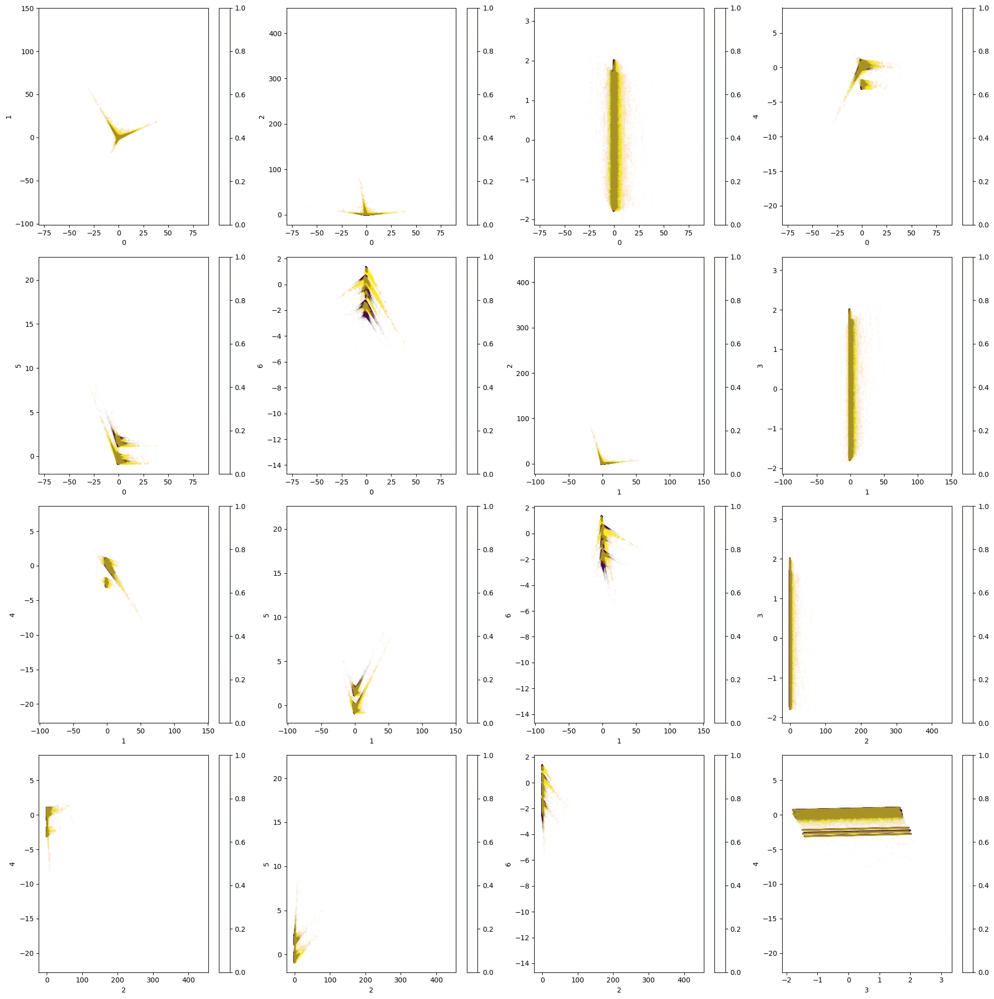

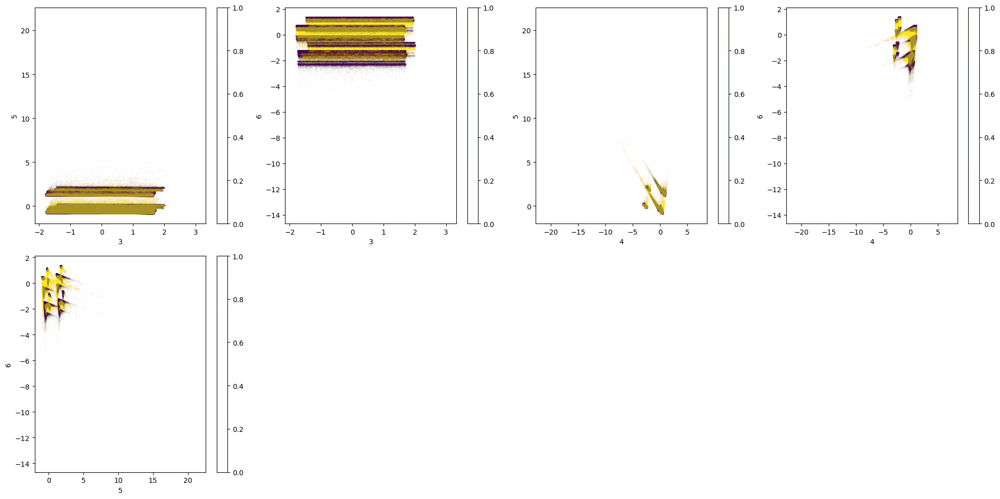

In [41]:
plot_scatter(X_clas_train_pca, y_clas_train, 2, 0.01, palette='viridis')

In [42]:
model_clas = model_clas.fit(X_clas_train_pca, y_clas_train)

In [43]:
clas_res_pd['PCA(7)'] = clas_res(y_clas_test, model_clas.predict(X_clas_test_pca))
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3),RFE(3),PCA(7)
0,precision(0),1.0,0.99,0.98,1.00,1.00
1,precision(1),1.0,0.56,0.70,0.55,0.86
2,recall(0),1.0,0.93,0.97,0.92,0.98
3,recall(1),1.0,0.94,0.74,1.00,0.99
4,f1(0),1.0,0.96,0.97,0.96,0.99
5,f1(1),1.0,0.70,0.72,0.71,0.92


## KernelPCA

In [44]:
ker_X_regr_train, ker_X_regr_test, ker_y_regr_train, ker_y_regr_test = train_test_split(X_regr_test, y_regr_test, test_size=0.5, random_state=42)
ker_X_clas_train, _, ker_y_clas_train, _ = train_test_split(X_clas_train, y_clas_train, test_size=0.994, stratify=y_clas_train, random_state=42)
ker_X_clas_train, ker_X_clas_test, ker_y_clas_train, ker_y_clas_test = train_test_split(ker_X_clas_train, ker_y_clas_train, test_size=0.5, stratify=ker_y_clas_train, random_state=42)

### Poly

In [45]:
regr_kpca_poly = KernelPCA(n_components=5, kernel='poly', random_state=42)
X_regr_train_kpca_poly = regr_kpca_poly.fit_transform(ker_X_regr_train)
X_regr_test_kpca_poly = regr_kpca_poly.transform(ker_X_regr_test)

X_regr_train_kpca_poly.shape, X_regr_test_kpca_poly.shape

((5379, 5), (5380, 5))

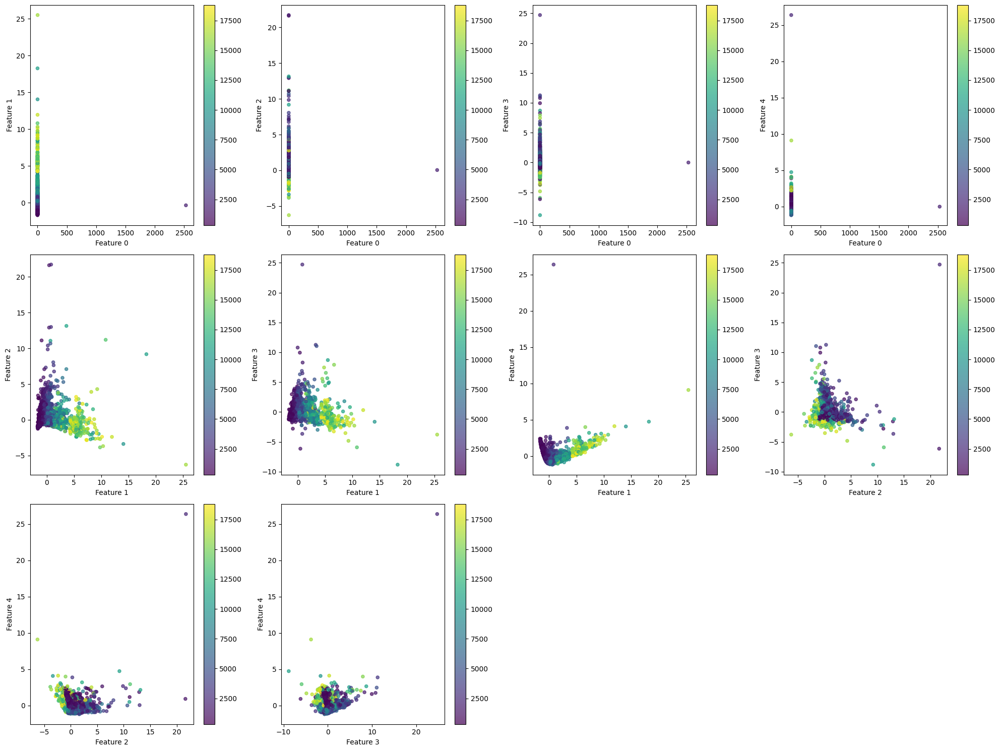

In [46]:
plot_scatter(X_regr_train_kpca_poly, ker_y_regr_train)

In [47]:
model_regr = model_regr.fit(X_regr_train_kpca_poly, ker_y_regr_train)

In [48]:
regr_res_pd['*KernelPCA_poly(5)'] = regr_res(ker_y_regr_test, model_regr.predict(X_regr_test_kpca_poly))
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4),RFE(4),PCA(5),*KernelPCA_poly(5)
0,MAE,307.383241,790.608878,786.582282,313.026531,413.841598,628.684499
1,RMSE,583.624732,1383.822260,1382.802438,586.250557,773.825541,1162.558738
2,R²,0.977653,0.874363,0.874548,0.977451,0.960714,0.911518
3,MAPE,0.083662,0.205722,0.199615,0.088765,0.114470,0.161918


In [49]:
clas_kpca_poly = KernelPCA(n_components=7, kernel='poly', random_state=42)
X_clas_train_kpca_poly = pd.DataFrame(clas_kpca_poly.fit_transform(ker_X_clas_train))
X_clas_test_kpca_poly = pd.DataFrame(clas_kpca_poly.transform(ker_X_clas_test))

X_clas_train_kpca_poly.shape, X_clas_test_kpca_poly.shape

((4380, 7), (4380, 7))

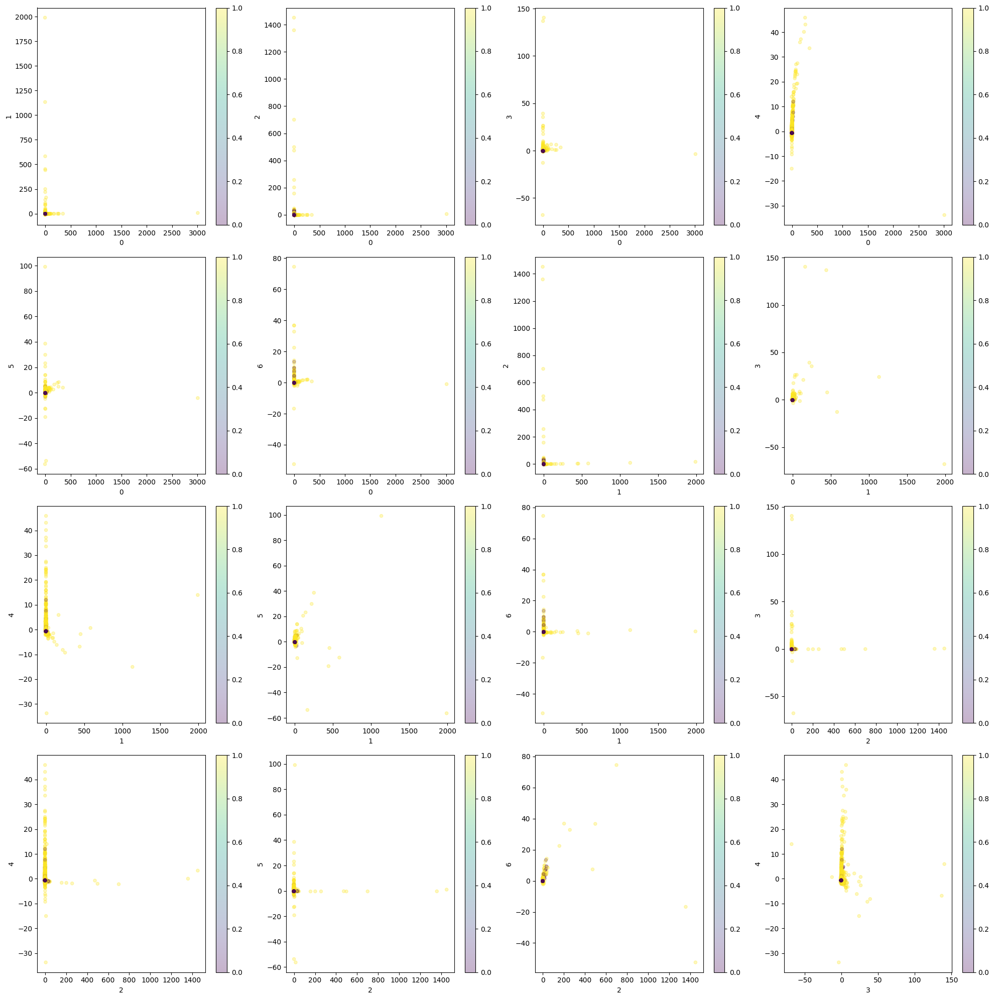

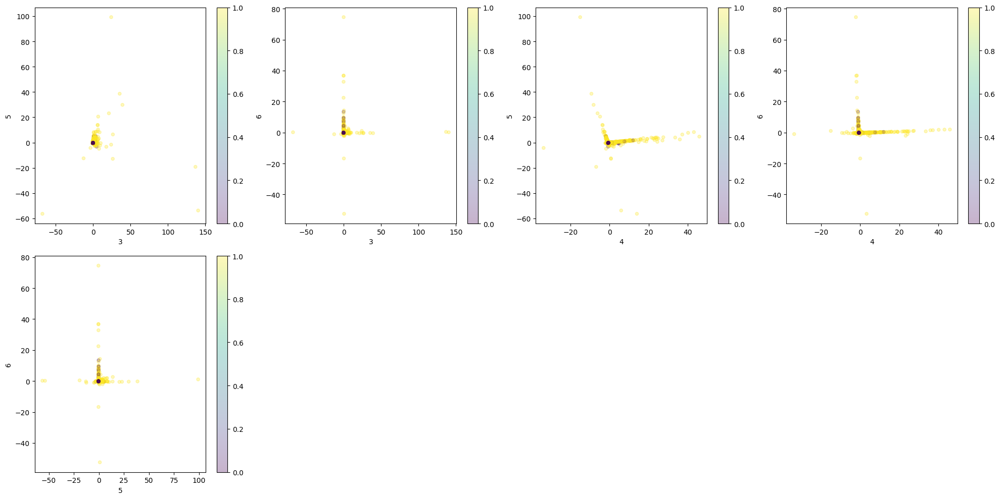

In [50]:
plot_scatter(X_clas_train_kpca_poly, ker_y_clas_train, alpha=0.3)

In [51]:
model_clas = model_clas.fit(X_clas_train_kpca_poly, ker_y_clas_train)

In [52]:
clas_res_pd['*KernelPCA_poly(7))'] = clas_res(ker_y_clas_test, model_clas.predict(X_clas_test_kpca_poly))
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3),RFE(3),PCA(7),*KernelPCA_poly(7))
0,precision(0),1.0,0.99,0.98,1.00,1.00,0.97
1,precision(1),1.0,0.56,0.70,0.55,0.86,0.94
2,recall(0),1.0,0.93,0.97,0.92,0.98,0.94
3,recall(1),1.0,0.94,0.74,1.00,0.99,0.97
4,f1(0),1.0,0.96,0.97,0.96,0.99,0.95
5,f1(1),1.0,0.70,0.72,0.71,0.92,0.96


### RBF

In [53]:
regr_kpca_rbf = KernelPCA(n_components=5, kernel='rbf', random_state=42)
X_regr_train_kpca_rbf = pd.DataFrame(regr_kpca_rbf.fit_transform(ker_X_regr_train))
X_regr_test_kpca_rbf = pd.DataFrame(regr_kpca_rbf.transform(ker_X_regr_test))

X_regr_train_kpca_rbf.shape, X_regr_test_kpca_rbf.shape

((5379, 5), (5380, 5))

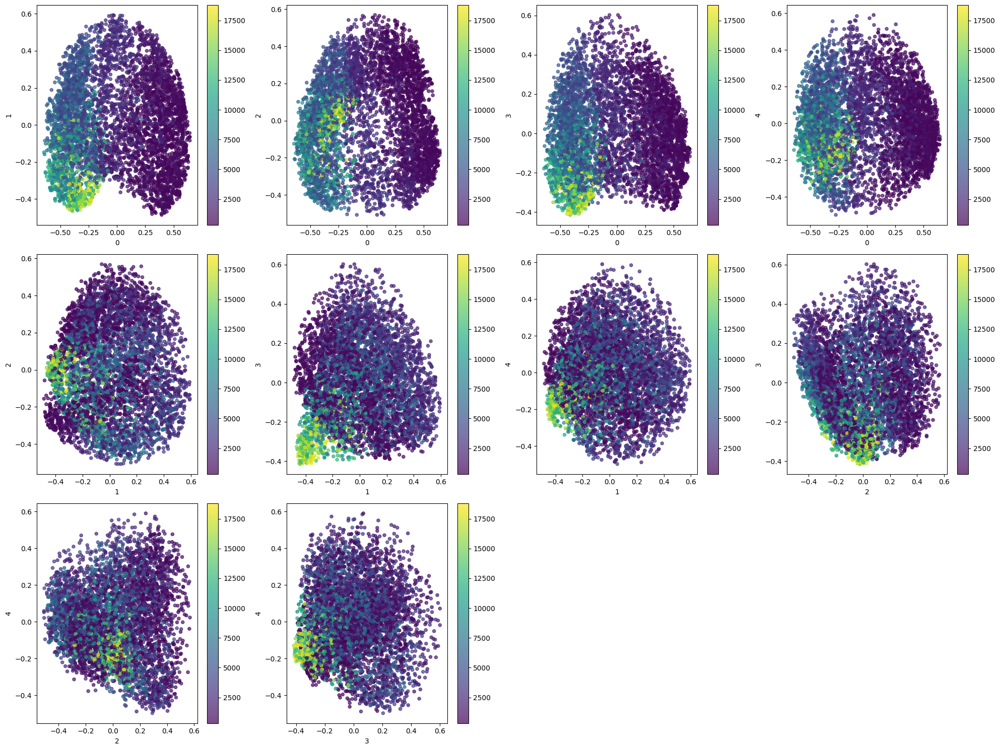

In [54]:
plot_scatter(X_regr_train_kpca_rbf, ker_y_regr_train)

In [55]:
model_regr = model_regr.fit(X_regr_train_kpca_rbf, ker_y_regr_train)

In [56]:
regr_res_pd['*KernelPCA_rbf(5)'] = regr_res(ker_y_regr_test, model_regr.predict(X_regr_test_kpca_rbf))
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4),RFE(4),PCA(5),*KernelPCA_poly(5),*KernelPCA_rbf(5)
0,MAE,307.383241,790.608878,786.582282,313.026531,413.841598,628.684499,873.005568
1,RMSE,583.624732,1383.822260,1382.802438,586.250557,773.825541,1162.558738,1544.524489
2,R²,0.977653,0.874363,0.874548,0.977451,0.960714,0.911518,0.843823
3,MAPE,0.083662,0.205722,0.199615,0.088765,0.114470,0.161918,0.270236


In [57]:
clas_kpca_rbf = KernelPCA(n_components=7, kernel='rbf', random_state=42)
X_clas_train_kpca_rbf = pd.DataFrame(clas_kpca_rbf.fit_transform(ker_X_clas_train))
X_clas_test_kpca_rbf = pd.DataFrame(clas_kpca_rbf.transform(ker_X_clas_test))

X_clas_train_kpca_rbf.shape, X_clas_test_kpca_rbf.shape

((4380, 7), (4380, 7))

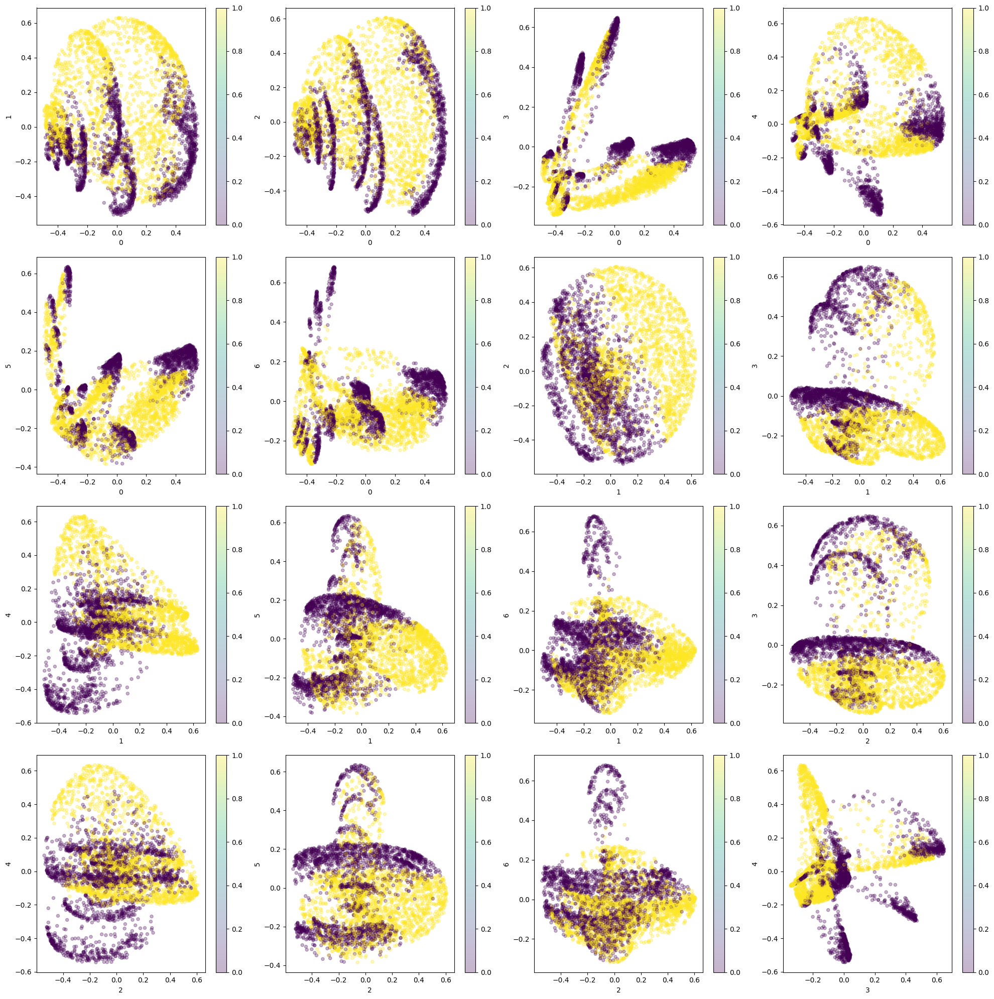

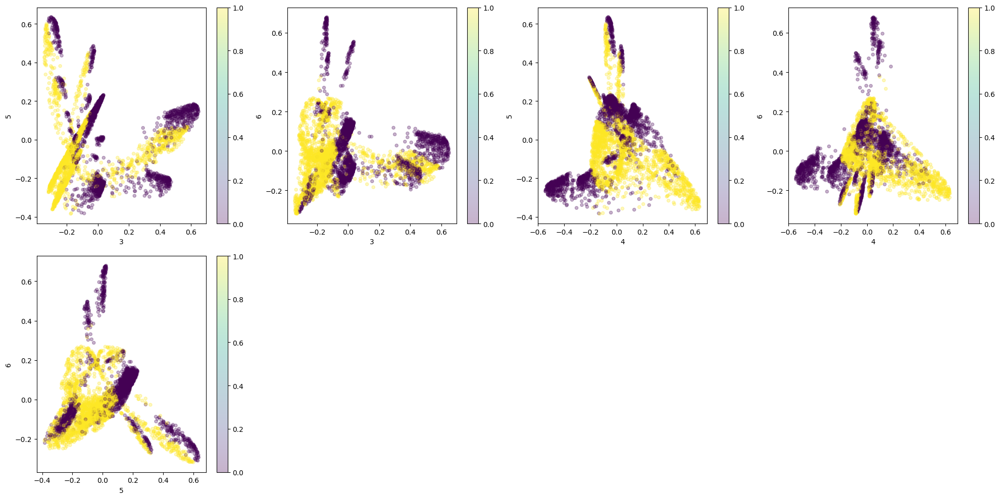

In [58]:
plot_scatter(X_clas_train_kpca_rbf, ker_y_clas_train, alpha=0.3)

In [59]:
model_clas = model_clas.fit(X_clas_train_kpca_rbf, ker_y_clas_train)

In [60]:
clas_res_pd['*KernelPCA_rbf(7))'] = clas_res(ker_y_clas_test, model_clas.predict(X_clas_test_kpca_rbf))
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3),RFE(3),PCA(7),*KernelPCA_poly(7)),*KernelPCA_rbf(7))
0,precision(0),1.0,0.99,0.98,1.00,1.00,0.97,0.96
1,precision(1),1.0,0.56,0.70,0.55,0.86,0.94,0.94
2,recall(0),1.0,0.93,0.97,0.92,0.98,0.94,0.94
3,recall(1),1.0,0.94,0.74,1.00,0.99,0.97,0.96
4,f1(0),1.0,0.96,0.97,0.96,0.99,0.95,0.95
5,f1(1),1.0,0.70,0.72,0.71,0.92,0.96,0.95


### Sigmoid

In [61]:
regr_kpca_sigmoid = KernelPCA(n_components=5, kernel='sigmoid', random_state=42)
X_regr_train_kpca_sigmoid = pd.DataFrame(regr_kpca_sigmoid.fit_transform(ker_X_regr_train))
X_regr_test_kpca_sigmoid = pd.DataFrame(regr_kpca_sigmoid.transform(ker_X_regr_test))

X_regr_train_kpca_sigmoid.shape, X_regr_test_kpca_sigmoid.shape

((5379, 5), (5380, 5))

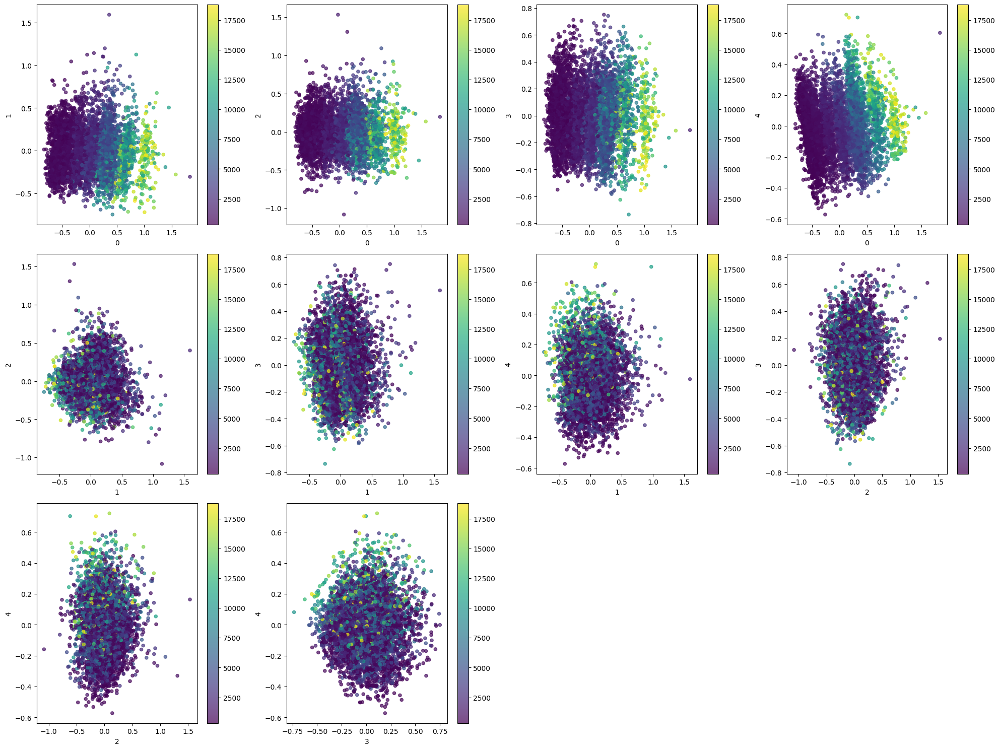

In [62]:
plot_scatter(X_regr_train_kpca_sigmoid, ker_y_regr_train)

In [63]:
model_regr = model_regr.fit(X_regr_train_kpca_sigmoid, ker_y_regr_train)

In [64]:
regr_res_pd['*KernelPCA_sigmoid(5))'] = regr_res(ker_y_regr_test, model_regr.predict(X_regr_test_kpca_sigmoid))
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4),RFE(4),PCA(5),*KernelPCA_poly(5),*KernelPCA_rbf(5),*KernelPCA_sigmoid(5))
0,MAE,307.383241,790.608878,786.582282,313.026531,413.841598,628.684499,873.005568,547.192891
1,RMSE,583.624732,1383.822260,1382.802438,586.250557,773.825541,1162.558738,1544.524489,995.304371
2,R²,0.977653,0.874363,0.874548,0.977451,0.960714,0.911518,0.843823,0.935146
3,MAPE,0.083662,0.205722,0.199615,0.088765,0.114470,0.161918,0.270236,0.150699


In [65]:
clas_kpca_sigmoid = KernelPCA(n_components=7, kernel='sigmoid', random_state=42)
X_clas_train_kpca_sigmoid = pd.DataFrame(clas_kpca_sigmoid.fit_transform(ker_X_clas_train))
X_clas_test_kpca_sigmoid = pd.DataFrame(clas_kpca_sigmoid.transform(ker_X_clas_test))

X_clas_train_kpca_sigmoid.shape, X_clas_test_kpca_sigmoid.shape

((4380, 7), (4380, 7))

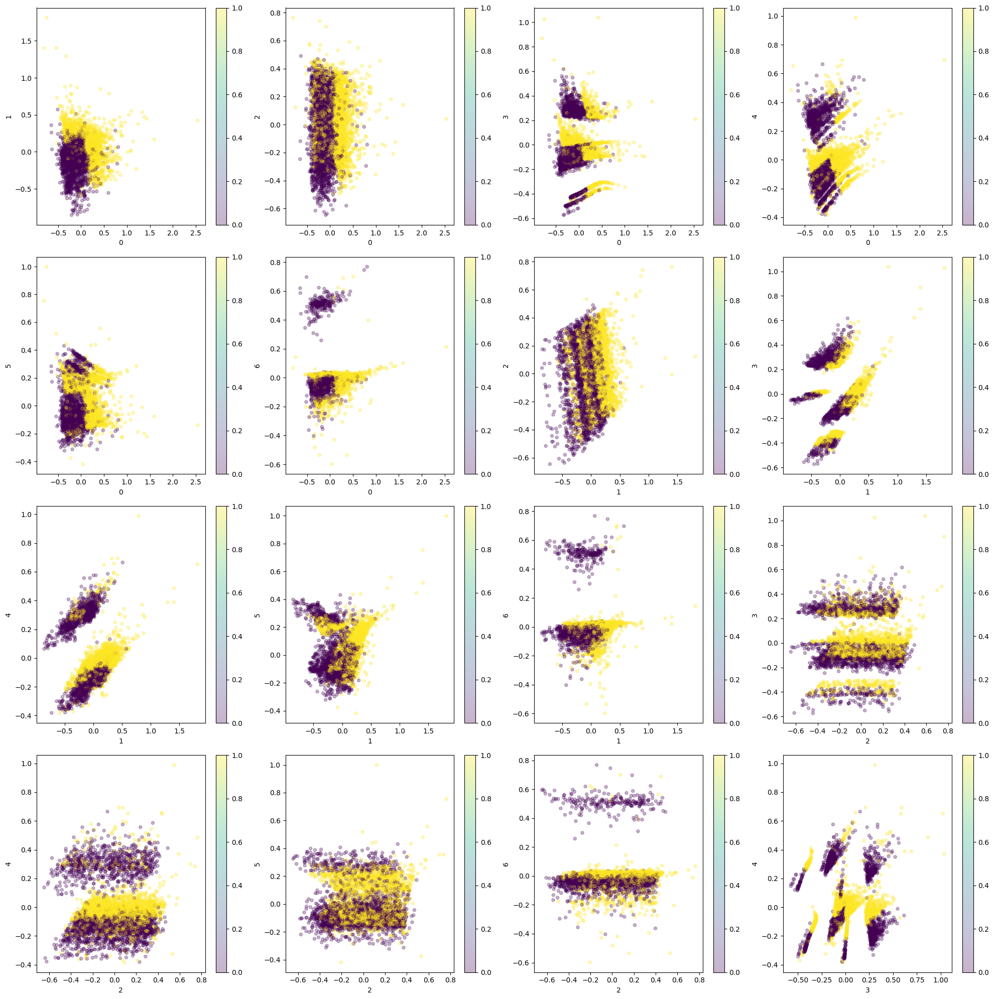

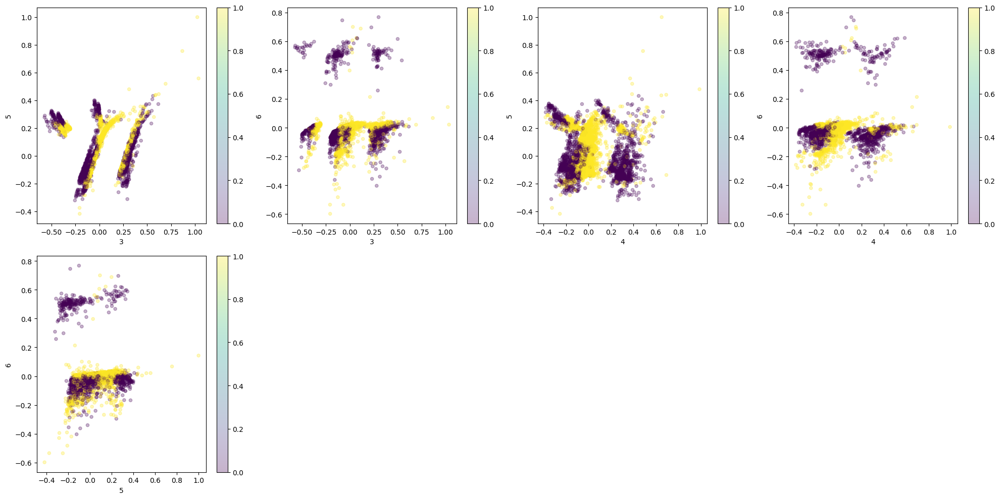

In [66]:
plot_scatter(X_clas_train_kpca_sigmoid, ker_y_clas_train, alpha=0.3)

In [67]:
model_clas = model_clas.fit(X_clas_train_kpca_sigmoid, ker_y_clas_train)

In [68]:
clas_res_pd['*KernelPCA_sigmoid(7))'] = clas_res(ker_y_clas_test, model_clas.predict(X_clas_test_kpca_sigmoid))
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3),RFE(3),PCA(7),*KernelPCA_poly(7)),*KernelPCA_rbf(7)),*KernelPCA_sigmoid(7))
0,precision(0),1.0,0.99,0.98,1.00,1.00,0.97,0.96,0.98
1,precision(1),1.0,0.56,0.70,0.55,0.86,0.94,0.94,0.97
2,recall(0),1.0,0.93,0.97,0.92,0.98,0.94,0.94,0.97
3,recall(1),1.0,0.94,0.74,1.00,0.99,0.97,0.96,0.98
4,f1(0),1.0,0.96,0.97,0.96,0.99,0.95,0.95,0.98
5,f1(1),1.0,0.70,0.72,0.71,0.92,0.96,0.95,0.98


## t-SNE

In [69]:
regr_tsne = TSNE(n_components=3, perplexity=30, random_state=42, verbose=1)
X_regr_train_tsne = pd.DataFrame(regr_tsne.fit_transform(ker_X_regr_train))
X_regr_test_tsne = pd.DataFrame(regr_tsne.fit_transform(ker_X_regr_test))

X_regr_train_tsne.shape, X_regr_test_tsne.shape

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5379 samples in 0.013s...
[t-SNE] Computed neighbors for 5379 samples in 0.347s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5379
[t-SNE] Computed conditional probabilities for sample 2000 / 5379
[t-SNE] Computed conditional probabilities for sample 3000 / 5379
[t-SNE] Computed conditional probabilities for sample 4000 / 5379
[t-SNE] Computed conditional probabilities for sample 5000 / 5379
[t-SNE] Computed conditional probabilities for sample 5379 / 5379
[t-SNE] Mean sigma: 0.552953
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.147949
[t-SNE] KL divergence after 1000 iterations: 1.217359
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5380 samples in 0.000s...
[t-SNE] Computed neighbors for 5380 samples in 0.417s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5380
[t-SNE] Computed conditional probabilities for sample 2000 / 5380
[t-SNE] Computed conditional 

((5379, 3), (5380, 3))

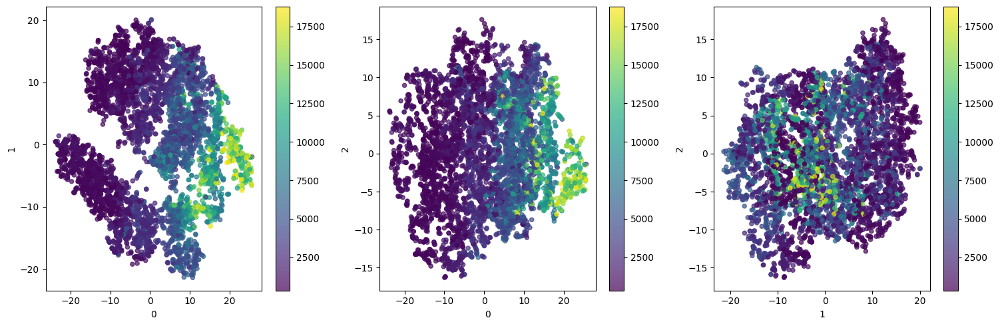

In [70]:
plot_scatter(X_regr_train_tsne, ker_y_regr_train)

In [71]:
model_regr = model_regr.fit(X_regr_train_tsne, ker_y_regr_train)

In [72]:
regr_res_pd['*t-SNE(3)'] = regr_res(ker_y_regr_test, model_regr.predict(X_regr_test_tsne))
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4),RFE(4),PCA(5),*KernelPCA_poly(5),*KernelPCA_rbf(5),*KernelPCA_sigmoid(5)),*t-SNE(3)
0,MAE,307.383241,790.608878,786.582282,313.026531,413.841598,628.684499,873.005568,547.192891,1364.980371
1,RMSE,583.624732,1383.822260,1382.802438,586.250557,773.825541,1162.558738,1544.524489,995.304371,2266.426311
2,R²,0.977653,0.874363,0.874548,0.977451,0.960714,0.911518,0.843823,0.935146,0.663713
3,MAPE,0.083662,0.205722,0.199615,0.088765,0.114470,0.161918,0.270236,0.150699,0.399488


In [73]:
clas_tsne = TSNE(n_components=3, perplexity=30, random_state=42)
X_clas_train_tsne = pd.DataFrame(clas_tsne.fit_transform(ker_X_clas_train))
X_clas_test_tsne = pd.DataFrame(clas_tsne.fit_transform(ker_X_clas_test))

X_clas_train_tsne.shape, X_clas_test_tsne.shape

((4380, 3), (4380, 3))

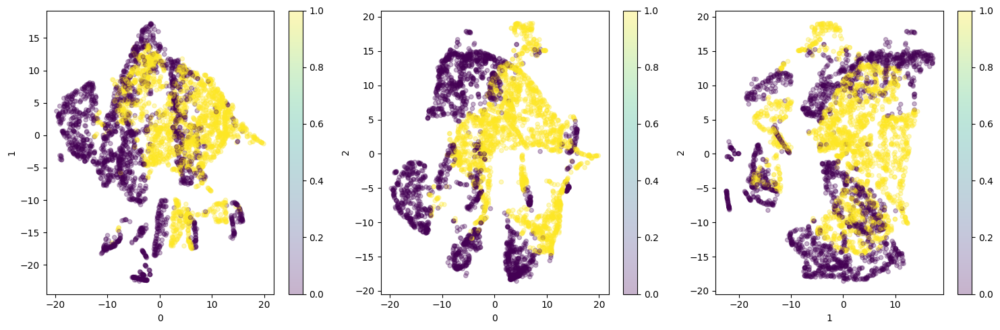

In [74]:
plot_scatter(X_clas_train_tsne, ker_y_clas_train, alpha=0.3)

In [75]:
model_clas = model_clas.fit(X_clas_train_tsne, ker_y_clas_train)

In [76]:
clas_res_pd['*t-SNE(3)'] = clas_res(ker_y_clas_test, model_clas.predict(X_clas_test_tsne))
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3),RFE(3),PCA(7),*KernelPCA_poly(7)),*KernelPCA_rbf(7)),*KernelPCA_sigmoid(7)),*t-SNE(3)
0,precision(0),1.0,0.99,0.98,1.00,1.00,0.97,0.96,0.98,0.80
1,precision(1),1.0,0.56,0.70,0.55,0.86,0.94,0.94,0.97,0.72
2,recall(0),1.0,0.93,0.97,0.92,0.98,0.94,0.94,0.97,0.68
3,recall(1),1.0,0.94,0.74,1.00,0.99,0.97,0.96,0.98,0.83
4,f1(0),1.0,0.96,0.97,0.96,0.99,0.95,0.95,0.98,0.73
5,f1(1),1.0,0.70,0.72,0.71,0.92,0.96,0.95,0.98,0.77


## Isomap

In [77]:
regr_isomap = Isomap(n_components=5, n_neighbors=10)
X_regr_train_isomap = pd.DataFrame(regr_isomap.fit_transform(ker_X_regr_train))
X_regr_test_isomap = pd.DataFrame(regr_isomap.transform(ker_X_regr_test))

X_regr_train_isomap.shape, X_regr_test_isomap.shape

((5379, 5), (5380, 5))

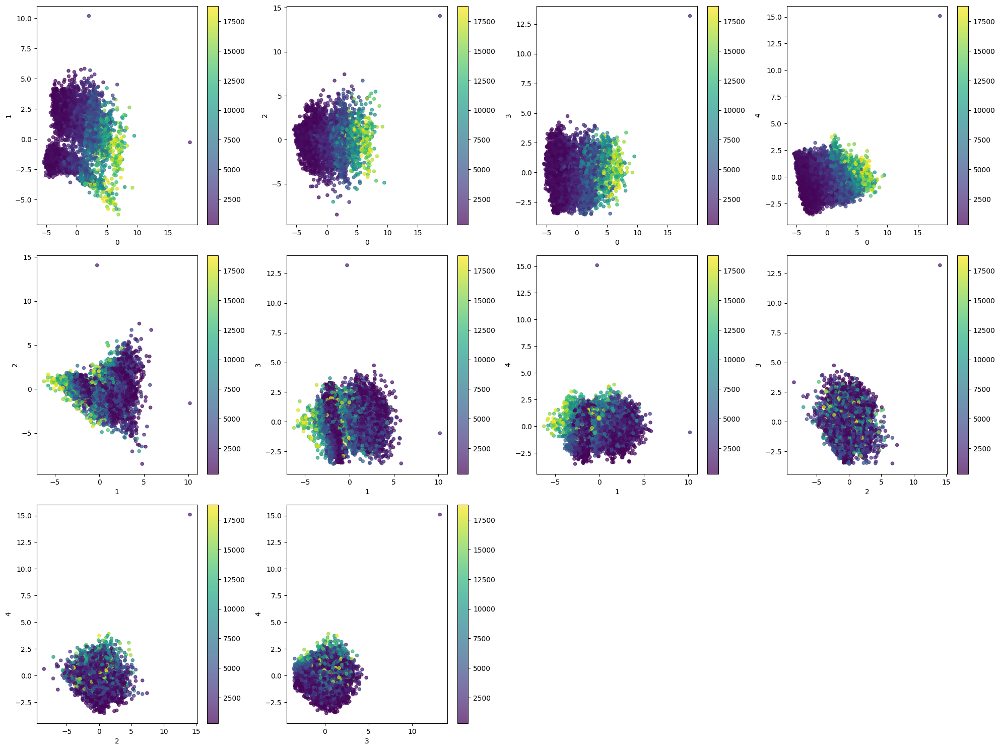

In [78]:
plot_scatter(X_regr_train_isomap, ker_y_regr_train)

In [79]:
model_regr = model_regr.fit(X_regr_train_isomap, ker_y_regr_train)

In [80]:
regr_res_pd['*Isomap(5)'] = regr_res(ker_y_regr_test, model_regr.predict(X_regr_test_isomap))
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4),RFE(4),PCA(5),*KernelPCA_poly(5),*KernelPCA_rbf(5),*KernelPCA_sigmoid(5)),*t-SNE(3),*Isomap(5)
0,MAE,307.383241,790.608878,786.582282,313.026531,413.841598,628.684499,873.005568,547.192891,1364.980371,577.004585
1,RMSE,583.624732,1383.822260,1382.802438,586.250557,773.825541,1162.558738,1544.524489,995.304371,2266.426311,1050.153381
2,R²,0.977653,0.874363,0.874548,0.977451,0.960714,0.911518,0.843823,0.935146,0.663713,0.927801
3,MAPE,0.083662,0.205722,0.199615,0.088765,0.114470,0.161918,0.270236,0.150699,0.399488,0.156358


In [81]:
clas_isomap = Isomap(n_components=7, n_neighbors=10)
X_clas_train_isomap = pd.DataFrame(clas_isomap.fit_transform(ker_X_clas_train))
X_clas_test_isomap = pd.DataFrame(clas_isomap.transform(ker_X_clas_test))

X_clas_train_isomap.shape, X_clas_test_isomap.shape

d:\Python\OmGTU\venv\Lib\site-packages\sklearn\manifold\_isomap.py:384: UserWarning: The number of connected components of the neighbors graph is 3 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
d:\Python\OmGTU\venv\Lib\site-packages\scipy\sparse\_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
d:\Python\OmGTU\venv\Lib\site-packages\scipy\sparse\_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
d:\Python\OmGTU\venv\Lib\site-packages\scipy\sparse\_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


((4380, 7), (4380, 7))

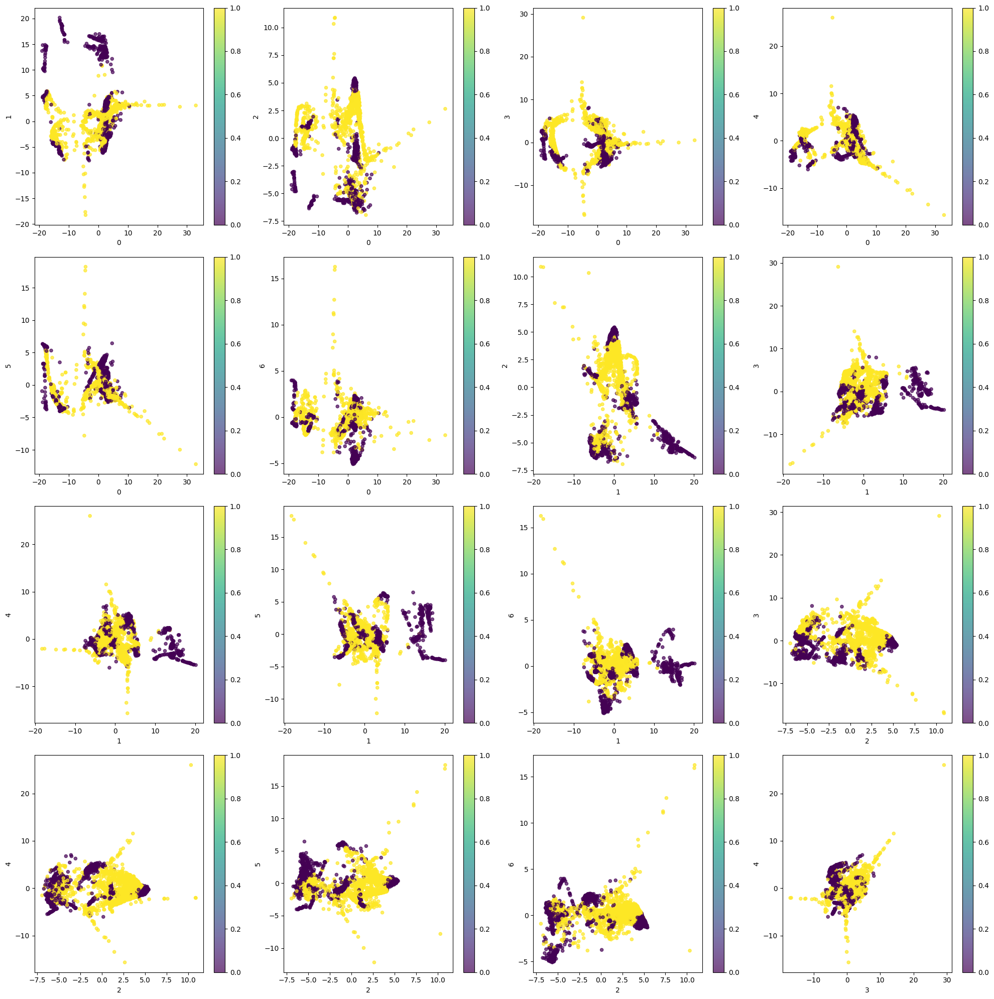

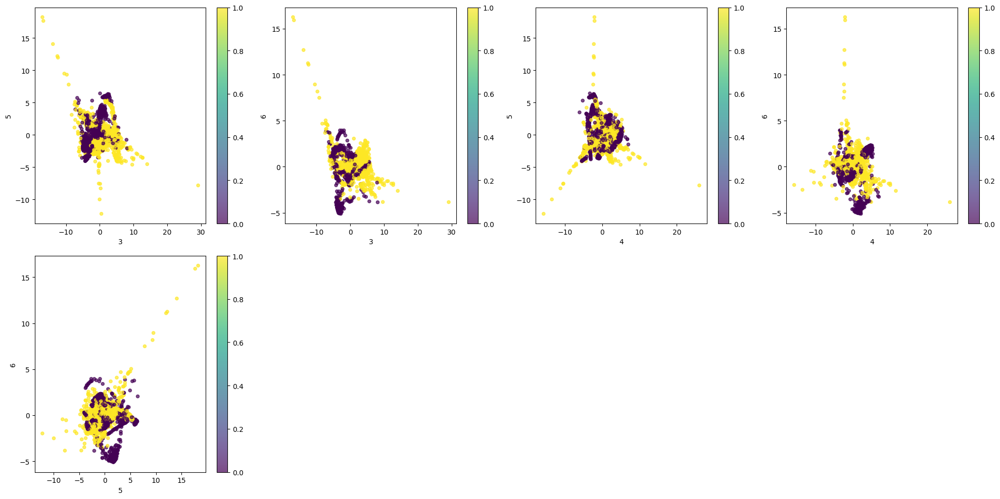

In [82]:
plot_scatter(X_clas_train_isomap, ker_y_clas_train)

In [83]:
model_clas = model_clas.fit(X_clas_train_isomap, ker_y_clas_train)

In [84]:
clas_res_pd['*Isomap(7)'] = clas_res(ker_y_clas_test, model_clas.predict(X_clas_test_isomap))
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3),RFE(3),PCA(7),*KernelPCA_poly(7)),*KernelPCA_rbf(7)),*KernelPCA_sigmoid(7)),*t-SNE(3),*Isomap(7)
0,precision(0),1.0,0.99,0.98,1.00,1.00,0.97,0.96,0.98,0.80,0.97
1,precision(1),1.0,0.56,0.70,0.55,0.86,0.94,0.94,0.97,0.72,0.96
2,recall(0),1.0,0.93,0.97,0.92,0.98,0.94,0.94,0.97,0.68,0.96
3,recall(1),1.0,0.94,0.74,1.00,0.99,0.97,0.96,0.98,0.83,0.97
4,f1(0),1.0,0.96,0.97,0.96,0.99,0.95,0.95,0.98,0.73,0.97
5,f1(1),1.0,0.70,0.72,0.71,0.92,0.96,0.95,0.98,0.77,0.97


## UMAP

In [85]:
regr_umap = UMAP(n_components=5)
X_regr_train_umap = pd.DataFrame(regr_umap.fit_transform(ker_X_regr_train))
X_regr_test_umap = pd.DataFrame(regr_umap.transform(ker_X_regr_test))

X_regr_train_umap.shape, X_regr_test_umap.shape

d:\Python\OmGTU\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Python\OmGTU\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


((5379, 5), (5380, 5))

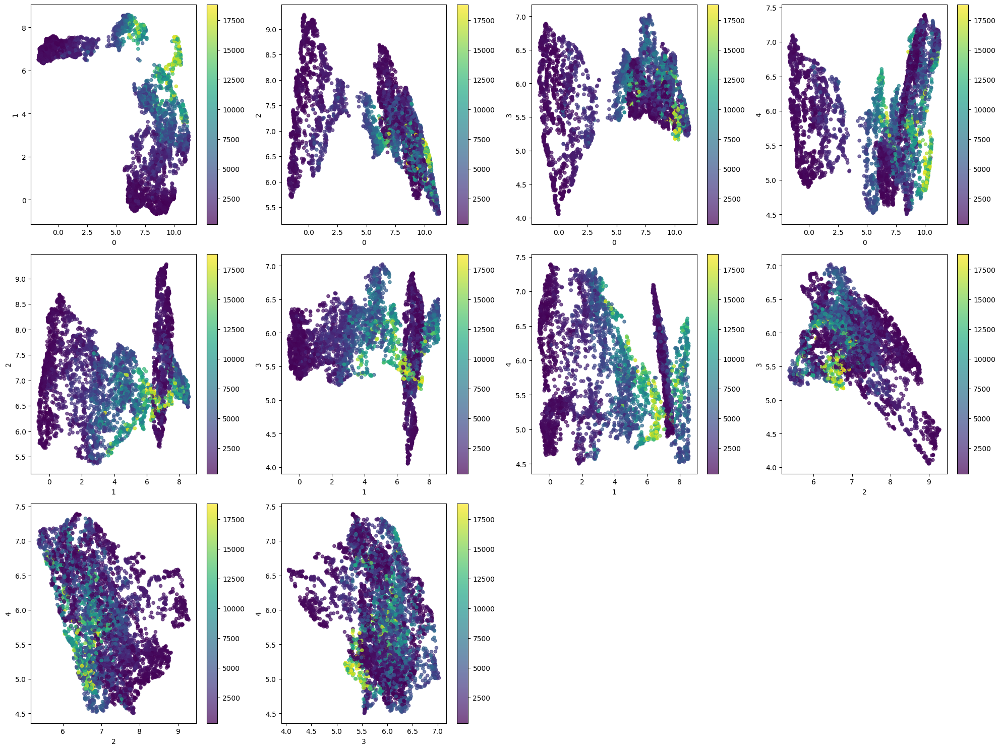

In [86]:
plot_scatter(X_regr_train_umap, ker_y_regr_train)

In [87]:
model_regr = model_regr.fit(X_regr_train_umap, ker_y_regr_train)

In [88]:
regr_res_pd['*UMAP(5)'] = regr_res(ker_y_regr_test, model_regr.predict(X_regr_test_umap))
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4),RFE(4),PCA(5),*KernelPCA_poly(5),*KernelPCA_rbf(5),*KernelPCA_sigmoid(5)),*t-SNE(3),*Isomap(5),*UMAP(5)
0,MAE,307.383241,790.608878,786.582282,313.026531,413.841598,628.684499,873.005568,547.192891,1364.980371,577.004585,717.644348
1,RMSE,583.624732,1383.822260,1382.802438,586.250557,773.825541,1162.558738,1544.524489,995.304371,2266.426311,1050.153381,1287.056554
2,R²,0.977653,0.874363,0.874548,0.977451,0.960714,0.911518,0.843823,0.935146,0.663713,0.927801,0.891552
3,MAPE,0.083662,0.205722,0.199615,0.088765,0.114470,0.161918,0.270236,0.150699,0.399488,0.156358,0.203274


In [89]:
clas_umap = UMAP(n_components=7)
X_clas_train_umap = pd.DataFrame(clas_umap.fit_transform(ker_X_clas_train))
X_clas_test_umap = pd.DataFrame(clas_umap.transform(ker_X_clas_test))

X_clas_train_umap.shape, X_clas_test_umap.shape

d:\Python\OmGTU\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Python\OmGTU\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


((4380, 7), (4380, 7))

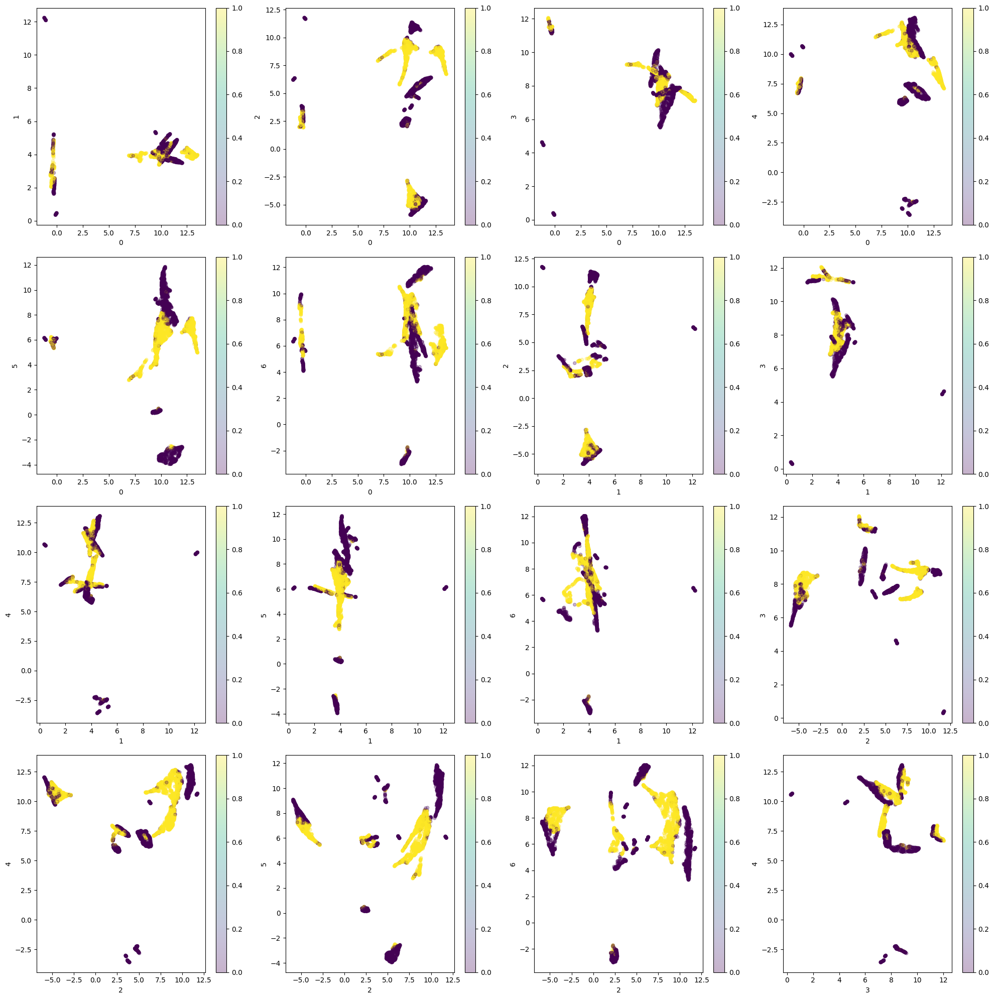

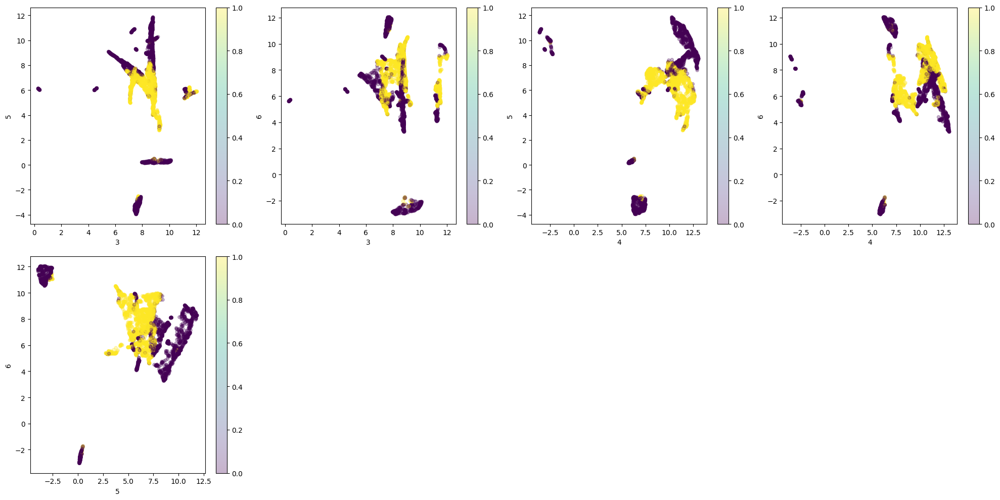

In [92]:
plot_scatter(X_clas_train_umap, ker_y_clas_train, alpha=0.3, palette='viridis')

In [91]:
model_clas = model_clas.fit(X_clas_train_umap, ker_y_clas_train)

In [93]:
clas_res_pd['*UMAP(7)'] = clas_res(ker_y_clas_test, model_clas.predict(X_clas_test_umap))
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3),RFE(3),PCA(7),*KernelPCA_poly(7)),*KernelPCA_rbf(7)),*KernelPCA_sigmoid(7)),*t-SNE(3),*Isomap(7),*UMAP(7)
0,precision(0),1.0,0.99,0.98,1.00,1.00,0.97,0.96,0.98,0.80,0.97,0.97
1,precision(1),1.0,0.56,0.70,0.55,0.86,0.94,0.94,0.97,0.72,0.96,0.94
2,recall(0),1.0,0.93,0.97,0.92,0.98,0.94,0.94,0.97,0.68,0.96,0.94
3,recall(1),1.0,0.94,0.74,1.00,0.99,0.97,0.96,0.98,0.83,0.97,0.97
4,f1(0),1.0,0.96,0.97,0.96,0.99,0.95,0.95,0.98,0.73,0.97,0.95
5,f1(1),1.0,0.70,0.72,0.71,0.92,0.96,0.95,0.98,0.77,0.97,0.96


## Анализ результатов

### Регрессия

In [94]:
regr_res_pd

,Metrics,Full_features(9),VarianceTreshold(3),SelectKBest(4),RFE(4),PCA(5),*KernelPCA_poly(5),*KernelPCA_rbf(5),*KernelPCA_sigmoid(5)),*t-SNE(3),*Isomap(5),*UMAP(5)
0,MAE,307.383241,790.608878,786.582282,313.026531,413.841598,628.684499,873.005568,547.192891,1364.980371,577.004585,717.644348
1,RMSE,583.624732,1383.822260,1382.802438,586.250557,773.825541,1162.558738,1544.524489,995.304371,2266.426311,1050.153381,1287.056554
2,R²,0.977653,0.874363,0.874548,0.977451,0.960714,0.911518,0.843823,0.935146,0.663713,0.927801,0.891552
3,MAPE,0.083662,0.205722,0.199615,0.088765,0.114470,0.161918,0.270236,0.150699,0.399488,0.156358,0.203274


На моих данных для задачи регрессии лучше вего уменьшить признаковое пространство сумели алгоритмы **RFE** (отброшено 5 признаков) на полных данных и **KernelPCA_sigmoid** (ужато до 5 признаков) на подвыборке из данных. Оценивал успешность по $R^2$ и $RMSE$.

### Классификация

In [95]:
clas_res_pd

,Metrics,Full_features(8),VarianceTreshold(2),SelectKBest(3),RFE(3),PCA(7),*KernelPCA_poly(7)),*KernelPCA_rbf(7)),*KernelPCA_sigmoid(7)),*t-SNE(3),*Isomap(7),*UMAP(7)
0,precision(0),1.0,0.99,0.98,1.00,1.00,0.97,0.96,0.98,0.80,0.97,0.97
1,precision(1),1.0,0.56,0.70,0.55,0.86,0.94,0.94,0.97,0.72,0.96,0.94
2,recall(0),1.0,0.93,0.97,0.92,0.98,0.94,0.94,0.97,0.68,0.96,0.94
3,recall(1),1.0,0.94,0.74,1.00,0.99,0.97,0.96,0.98,0.83,0.97,0.97
4,f1(0),1.0,0.96,0.97,0.96,0.99,0.95,0.95,0.98,0.73,0.97,0.95
5,f1(1),1.0,0.70,0.72,0.71,0.92,0.96,0.95,0.98,0.77,0.97,0.96


На моих данных для задачи классификации лучше вего уменьшить признаковое пространство сумели алгоритмы **PCA** (ужато до 8) на полных данных и **KernelPCA_sigmoid** (ужато до 7 признаков) на подвыборке из данных. Оценивал успешность по $f-score$.

# 4. Реализация алгоритма PCA

In [96]:
from algorythms.kmeans import CustomKMeans
from algorythms.pca import CustomPCA

In [97]:
clas_pca = CustomPCA(2)
X_clas_custom_pca = clas_pca.fit_transform(X_clas)

X_clas_custom_pca.shape

(1000000, 2)

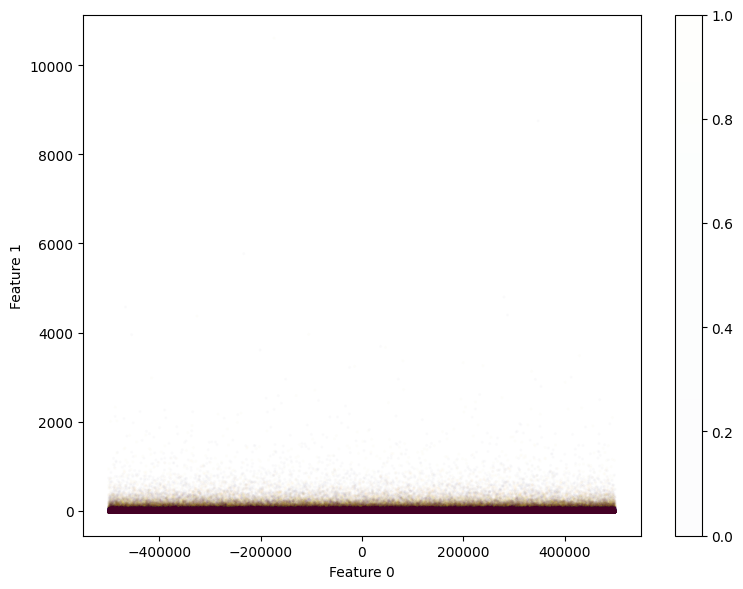

In [98]:
plot_scatter(X_clas_custom_pca, y_clas, 2, 0.01)

In [99]:
kmeans = CustomKMeans(n_clusters=2, init='k-means++', random_state=42)
kmeans.fit(X_clas_custom_pca)

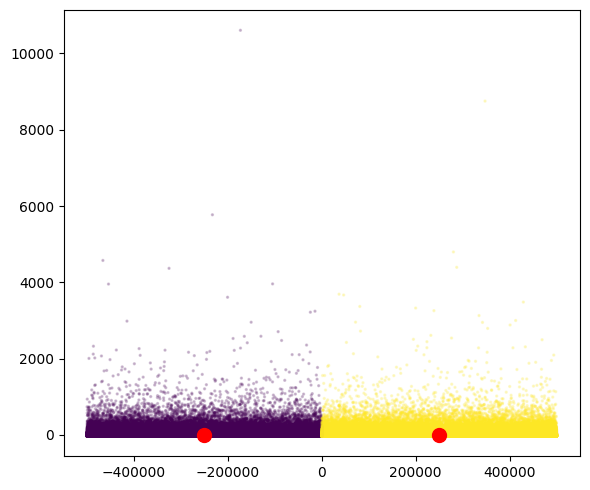

In [100]:
plt.figure(figsize=(6, 5))

plt.scatter(X_clas_custom_pca[:, 0], X_clas_custom_pca[:, 1], c=kmeans.labels_, cmap='viridis', s=2, alpha=0.2)
plt.scatter(kmeans.centroids[:, 0], kmeans.centroids[:, 1], c='red', s=100, marker='o')

plt.tight_layout()
plt.show()

**Интерпретация полученных кластеров:**

Поскольку данные изначально представленны как "угол", то после применения PCA (метод главных компонент) данные принимают форму развёрнутого угла (или же прямой/отрезка). При работе KMeans центроиды придут в середины сторон этого самого угла, а так как данные центрированы, то по итогу получим два кластера - положительные и отрицательные значения по 0 признаку. Прикладной интерпретации такой кластеризации нет, либо я не сумел дойти до такой интерпретации.